The solution code is divided into the following sections:

Data understanding


Preprocessing

EDA

Handle missing values

Feature Engineering

Model 1 - Customer Churn Prediction

Feature Selection and Dimensionality Reduction using PCA

Handling Class Imbalance using Weight of class and SMOTE

Baseline Model building

Cross validation

Hyperparameter tuning

Model Evaluation

Model Selection

Model 2 - Identifying Strong Predictors of churn (Important features)

Model building
Hyperparameter tuning with Cross Validation
Model Evaluation
Strategy recommendation to manage customer churn

## Importing All the libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
#for PCA
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from sklearn.metrics import r2_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn import svm 
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import roc_curve, auc
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Suppressing Warnings
#from fancyimpute import KNN  
#from sklearn.impute import KNNImputer
import warnings
warnings.filterwarnings('ignore')

# 1. Reading And UnderStanding The Data

In [212]:
churn_dataset=pd.read_csv(r"C:\Users\Hp\Documents\Course\Time Series Assignment\telecom_churn_data.csv")
churn_dataset.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.38,...,0,1.00,1.00,1.00,nan,968,30.40,0.00,101.20,3.58
1,7001865778,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.05,...,0,nan,1.00,1.00,nan,1006,0.00,0.00,0.00,0.00
2,7001625959,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.69,...,0,nan,nan,nan,1.00,1103,0.00,0.00,4.17,0.00
3,7001204172,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.34,...,0,nan,nan,nan,nan,2491,0.00,0.00,0.00,0.00
4,7000142493,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.64,...,0,0.00,nan,nan,nan,1526,0.00,0.00,0.00,0.00


In [213]:
churn_dataset.shape

(99999, 226)

In [214]:
churn_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


There are 226 columns are available to us to analyse and out of those datas, there are 212 columns are of type float and int and 12 columns are of ob ject types.

In [215]:
churn_dataset.describe(include='all')

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,99999.00,99999.00,98981.00,98981.00,98981.00,99999,99398,98899,98340,99999.00,...,99999.00,25153.00,25571.00,26339.00,25922.00,99999.00,99999.00,99999.00,99999.00,99999.00
unique,nan,nan,nan,nan,nan,1,1,1,1,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
top,nan,nan,nan,nan,nan,6/30/2014,7/31/2014,8/31/2014,9/30/2014,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
freq,nan,nan,nan,nan,nan,99999,99398,98899,98340,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
mean,7001207270.39,109.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,282.99,...,0.08,0.91,0.91,0.89,0.86,1219.85,68.17,66.84,60.02,3.30
std,695669.39,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,328.44,...,0.65,0.28,0.29,0.31,0.35,954.73,267.58,271.20,253.94,32.41
min,7000000074.00,109.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,-2258.71,...,0.00,0.00,0.00,0.00,0.00,180.00,0.00,0.00,0.00,0.00
25%,7000606232.50,109.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,93.41,...,0.00,1.00,1.00,1.00,1.00,467.00,0.00,0.00,0.00,0.00
50%,7001204632.00,109.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,197.70,...,0.00,1.00,1.00,1.00,1.00,863.00,0.00,0.00,0.00,0.00
75%,7001812030.50,109.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,371.06,...,0.00,1.00,1.00,1.00,1.00,1807.50,0.00,0.00,0.00,0.00


### Get only the high value customers

As per the objective, let's first filter out the dataset to have only the high value customer records.

In [216]:
#X is the 70th percentile of 
# the average recharge amount in the first two months (the good phase)

# lets dervie features to extract high value customers
# lets find out total amount spent by customers on data recharge,we have two colums available to find this out 
# lets introduce a new column total_rech_data_amt_x which can be calculated as av_rech_amt_data_x * total_rech_data_x

churn_dataset['total_rech_data_amt_6'] = churn_dataset['av_rech_amt_data_6'] * churn_dataset['total_rech_data_6']
churn_dataset['total_rech_data_amt_7'] = churn_dataset['av_rech_amt_data_7'] * churn_dataset['total_rech_data_7']


# now we dont need columns av_rech_amt_data_x,total_rech_data_x , lets drop them
churn_dataset.drop(['total_rech_data_6','total_rech_data_7',
'av_rech_amt_data_6','av_rech_amt_data_7'],axis = 1,inplace = True)

# lets find out the average recharge done in the first two months(june & july) - the good phase
# total amount spend would be the sum of total data recharge done & total call/sms recharges
telecom_av_rech_6n7 = (churn_dataset['total_rech_amt_6'].fillna(0) 
+ churn_dataset['total_rech_amt_7'].fillna(0) 
+ churn_dataset['total_rech_data_amt_6'].fillna(0) 
+ churn_dataset['total_rech_data_amt_7'].fillna(0))/2

# take 70 percentile of the calculated average amount
percentile_70_6n7 = np.percentile(telecom_av_rech_6n7, 70.0)
print("70 percentile is : ", percentile_70_6n7)

# fitler the given data set based on 70th percentile
churn_dataset_hvc = churn_dataset[telecom_av_rech_6n7 >= percentile_70_6n7]

print("Dimensions of the filtered dataset:",churn_dataset_hvc.shape)

70 percentile is :  478.0
Dimensions of the filtered dataset: (30001, 224)


### Classify the churn and non-churn customers

There is no target variable is mentioned int the dataset, Let create the target variable churn..

In [217]:
# lets introduce a new column "churn", values would be either 1 (churn) or 0 (non-churn)
# we will calculate churn/non-churn based on the usage as mentioned in the problem statement
churn_dataset_hvc['churn'] = np.where(churn_dataset_hvc[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']].sum(axis=1) == 0, 1,0)
churn_dataset_hvc.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_amt_6,total_rech_data_amt_7,churn
0,7000842753,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.38,...,1.00,nan,968,30.40,0.00,101.20,3.58,252.00,252.00,1
7,7000701601,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.18,...,nan,nan,802,57.74,19.38,18.74,0.00,nan,nan,1
8,7001524846,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,378.72,...,1.00,nan,315,21.03,910.65,122.16,0.00,nan,354.00,0
21,7002124215,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,514.45,...,nan,nan,720,0.00,0.00,0.00,0.00,nan,nan,0
23,7000887461,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,74.35,...,1.00,1.00,604,40.45,51.86,0.00,0.00,nan,712.00,0


In [218]:
churn_dataset_hvc['churn'].value_counts()

0    27560
1     2441
Name: churn, dtype: int64

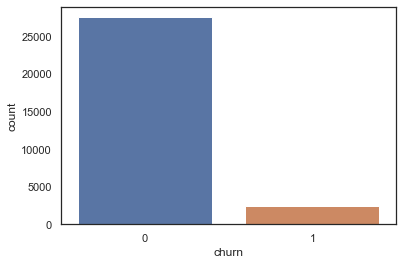

In [219]:
sns.countplot(x='churn', data=churn_dataset_hvc)


As we observed earlier, churn rate is low in the overall dataset. So we would need to handle the class imbalance.

## EXPLORATORY DATA ANALYSIS

### Step-2 Data Cleaning & data Preparation:

In [220]:
null_value_table=pd.DataFrame((churn_dataset_hvc.isna().sum()/churn_dataset_hvc.shape[0])*100).sort_values(0,ascending=False )
null_value_table.columns=['null percentage']
null_value_table[null_value_table['null percentage']>0]

,null percentage
date_of_last_rech_data_9,49.27
arpu_2g_9,49.27
count_rech_2g_9,49.27
total_rech_data_9,49.27
count_rech_3g_9,49.27
night_pck_user_9,49.27
av_rech_amt_data_9,49.27
fb_user_9,49.27
arpu_3g_9,49.27
max_rech_data_9,49.27


In [221]:
#getting the coulmns with only one unique value
cols_to_remove = []
for i in list(churn_dataset_hvc):
    if len(churn_dataset_hvc[i].value_counts()) == 1:
        cols_to_remove.append(i)
print(cols_to_remove)

['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_t2c_mou_9', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8', 'std_ic_t2o_mou_9']


In [222]:
(churn_dataset_hvc[cols_to_remove].isnull().sum()/churn_dataset_hvc.shape[0])*100

circle_id              0.00
loc_og_t2o_mou         0.75
std_og_t2o_mou         0.75
loc_ic_t2o_mou         0.75
last_date_of_month_6   0.00
last_date_of_month_7   0.09
last_date_of_month_8   0.55
last_date_of_month_9   1.22
std_og_t2c_mou_6       1.82
std_og_t2c_mou_7       1.79
std_og_t2c_mou_8       3.91
std_og_t2c_mou_9       6.34
std_ic_t2o_mou_6       1.82
std_ic_t2o_mou_7       1.79
std_ic_t2o_mou_8       3.91
std_ic_t2o_mou_9       6.34
dtype: float64

In [223]:
churn_dataset_hvc['std_ic_t2o_mou_9'].value_counts(dropna=False)

0.00    28100
nan      1901
Name: std_ic_t2o_mou_9, dtype: int64

Dropping highly skewed columns as it is not providing any information related to target variable

In [224]:
#So, above columns should not have any predictive power and we can drop them
churn_dataset_hvc = churn_dataset_hvc.drop(cols_to_remove, axis = 1)
churn_dataset_hvc.shape

(30001, 209)

 Now we will delete 9th month columns because we would predict churn/non-churn later based on data from the 1st 3 months

In [225]:

cols_to_drop = [col for col in churn_dataset_hvc.columns if '_9' in col]
print(cols_to_drop)
churn_dataset_hvc = churn_dataset_hvc.drop(cols_to_drop, axis = 1)
churn_dataset_hvc.shape

['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9', 'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9', 'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9', 'night_pck_user_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'fb_user_9']


(30001, 158)

In [226]:
recharge_col=churn_dataset_hvc.filter(like='rech').describe().columns
recharge_col

Index(['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8',
       'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8',
       'total_rech_data_8', 'max_rech_data_6', 'max_rech_data_7',
       'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7',
       'count_rech_3g_8', 'av_rech_amt_data_8', 'total_rech_data_amt_6',
       'total_rech_data_amt_7'],
      dtype='object')

In [227]:
null_value_table=pd.DataFrame((churn_dataset_hvc.isna().sum()/churn_dataset_hvc.shape[0])*100).sort_values(0,ascending=False )
null_value_table.columns=['null percentage']
null_value_table[null_value_table['null percentage']>40]

,null percentage
count_rech_2g_8,46.83
max_rech_data_8,46.83
fb_user_8,46.83
arpu_3g_8,46.83
total_rech_data_8,46.83
count_rech_3g_8,46.83
date_of_last_rech_data_8,46.83
av_rech_amt_data_8,46.83
night_pck_user_8,46.83
arpu_2g_8,46.83


In [228]:
churn_dataset_hvc[recharge_col].describe()

,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,total_rech_data_8,...,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_8,total_rech_data_amt_6,total_rech_data_amt_7
count,30001.00,30001.00,30001.00,30001.00,30001.00,30001.00,30001.00,30001.00,30001.00,15953.00,...,15953.00,16756.00,17057.00,15953.00,16756.00,17057.00,15953.00,15953.00,16756.00,17057.00
mean,11.85,11.72,9.97,660.73,660.50,584.37,169.28,172.20,160.14,3.05,...,136.33,2.22,2.46,2.27,0.76,0.80,0.78,229.68,816.05,929.09
std,9.43,9.43,9.27,561.03,582.43,611.25,175.32,181.39,173.21,3.54,...,119.53,3.01,3.24,3.11,1.48,1.62,1.67,217.35,1819.23,1860.01
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00
25%,6.00,6.00,4.00,360.00,352.00,250.00,110.00,110.00,50.00,1.00,...,25.00,0.00,0.00,0.00,0.00,0.00,0.00,100.00,154.00,154.00
50%,9.00,9.00,8.00,566.00,562.00,490.00,120.00,128.00,130.00,2.00,...,152.00,1.00,1.00,1.00,0.00,0.00,0.00,179.00,324.00,399.00
75%,15.00,15.00,13.00,834.00,831.00,776.00,200.00,200.00,198.00,4.00,...,198.00,3.00,3.00,3.00,1.00,1.00,1.00,274.00,855.25,992.00
max,307.00,138.00,196.00,35190.00,40335.00,45320.00,4010.00,4010.00,4449.00,60.00,...,1555.00,42.00,48.00,44.00,29.00,35.00,45.00,4061.00,105644.00,55080.00


As we see the min value of some of the recharge columns is 1 so we can replace Nan values of these column with zero as it would mean there is no recharge happend on these columns

In [229]:
# create a list of recharge columns where we will impute missing values with zeroes
zero_impute = ['total_rech_data_8','av_rech_amt_data_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8']

In [230]:
# impute missing values with 0
churn_dataset_hvc[zero_impute] = churn_dataset_hvc[zero_impute].apply(lambda x: x.fillna(0))

In [231]:
# now, let's make sure values are imputed correctly
print("Missing value ratio:\n")
print(churn_dataset_hvc[zero_impute].isnull().sum()*100/churn_dataset.shape[1])

Missing value ratio:

total_rech_data_8    0.00
av_rech_amt_data_8   0.00
max_rech_data_6      0.00
max_rech_data_7      0.00
max_rech_data_8      0.00
dtype: float64


In [232]:
# Get the unique count
for col in churn_dataset_hvc.columns:
        print(col, len(churn_dataset_hvc[col].unique()))

mobile_number 30001
arpu_6 29072
arpu_7 29084
arpu_8 28073
onnet_mou_6 16891
onnet_mou_7 16988
onnet_mou_8 15873
offnet_mou_6 21221
offnet_mou_7 21264
offnet_mou_8 20164
roam_ic_mou_6 4049
roam_ic_mou_7 3386
roam_ic_mou_8 3434
roam_og_mou_6 4745
roam_og_mou_7 3995
roam_og_mou_8 4002
loc_og_t2t_mou_6 10421
loc_og_t2t_mou_7 10395
loc_og_t2t_mou_8 10064
loc_og_t2m_mou_6 15626
loc_og_t2m_mou_7 15675
loc_og_t2m_mou_8 15131
loc_og_t2f_mou_6 3091
loc_og_t2f_mou_7 3101
loc_og_t2f_mou_8 2990
loc_og_t2c_mou_6 1683
loc_og_t2c_mou_7 1765
loc_og_t2c_mou_8 1724
loc_og_mou_6 18349
loc_og_mou_7 18503
loc_og_mou_8 17583
std_og_t2t_mou_6 11103
std_og_t2t_mou_7 11255
std_og_t2t_mou_8 10252
std_og_t2m_mou_6 12876
std_og_t2m_mou_7 12889
std_og_t2m_mou_8 11804
std_og_t2f_mou_6 1657
std_og_t2f_mou_7 1600
std_og_t2f_mou_8 1519
std_og_mou_6 15923
std_og_mou_7 15959
std_og_mou_8 14720
isd_og_mou_6 1032
isd_og_mou_7 1036
isd_og_mou_8 887
spl_og_mou_6 3051
spl_og_mou_7 3318
spl_og_mou_8 3194
og_others_6 842
og_ot

fb_user and night_pack_user columns are of nominal type 0 and 1. Since missing values could be of another type, imputing them as 2.

In [233]:
# Filling the missing values of fb and night pack user columns as 2, as this could be an another type that was marked as NA
cols_6 = ['fb_user_6','night_pck_user_6']
cols_7 = ['fb_user_7','night_pck_user_7']
cols_8 = ['fb_user_8','night_pck_user_8']

churn_dataset_hvc[cols_6] = churn_dataset_hvc[cols_6].fillna(2)
churn_dataset_hvc[cols_7] = churn_dataset_hvc[cols_7].fillna(2)
churn_dataset_hvc[cols_8] = churn_dataset_hvc[cols_8].fillna(2)

In [234]:
# filling the missing values as 0
cols_6 = ['count_rech_3g_6','max_rech_data_6','total_rech_data_amt_6','arpu_3g_6','count_rech_2g_6','arpu_2g_6']
cols_7 = ['count_rech_3g_7','max_rech_data_7','total_rech_data_amt_7','arpu_3g_7','count_rech_2g_7','arpu_2g_7']
cols_8 = ['count_rech_3g_8','max_rech_data_8','arpu_3g_8','total_rech_data_8','count_rech_2g_8','arpu_2g_8']

churn_dataset_hvc[cols_6] = churn_dataset_hvc[cols_6].fillna(0)
churn_dataset_hvc[cols_7] = churn_dataset_hvc[cols_7].fillna(0)
churn_dataset_hvc[cols_8] = churn_dataset_hvc[cols_8].fillna(0)

We will drop date column as we are not doing any time series analysia for this type of data

In [235]:

date_col=churn_dataset_hvc.filter(like='date').columns
date_col
churn_dataset_hvc.drop(date_col,axis=1,inplace=True)

In [236]:
null_value_table=pd.DataFrame((churn_dataset_hvc.isna().sum()/churn_dataset_hvc.shape[0])*100).sort_values(0,ascending=False )
null_value_table.columns=['null percentage']
null_value_table[null_value_table['null percentage']>0]

,null percentage
loc_ic_mou_8,3.91
std_ic_t2t_mou_8,3.91
isd_og_mou_8,3.91
std_og_t2m_mou_8,3.91
spl_og_mou_8,3.91
std_og_t2t_mou_8,3.91
og_others_8,3.91
loc_og_mou_8,3.91
loc_ic_t2t_mou_8,3.91
loc_og_t2c_mou_8,3.91


In [237]:
num_columns=churn_dataset_hvc[null_value_table[null_value_table['null percentage']>0].index].describe()

In [238]:
#imputing with median value

for i in num_columns:
    churn_dataset_hvc[i].fillna((churn_dataset_hvc[i].median()), inplace=True)

In [239]:
null_value_table=pd.DataFrame((churn_dataset_hvc.isna().sum()/churn_dataset_hvc.shape[0])*100).sort_values(0,ascending=False )
null_value_table.columns=['null percentage']
null_value_table[null_value_table['null percentage']>0]

,null percentage


In [240]:
corr=churn_dataset_hvc.corr()
corr

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_amt_6,total_rech_data_amt_7,churn
mobile_number,1.00,0.03,0.03,0.03,0.01,0.01,0.01,0.02,0.01,0.02,...,-0.00,-0.01,0.32,-0.03,-0.03,-0.04,-0.01,-0.02,-0.02,-0.03
arpu_6,0.03,1.00,0.67,0.61,0.34,0.22,0.19,0.51,0.34,0.29,...,0.18,0.10,0.04,0.06,0.06,0.11,0.05,0.09,-0.02,0.07
arpu_7,0.03,0.67,1.00,0.76,0.21,0.32,0.27,0.35,0.49,0.39,...,0.10,0.06,0.03,0.08,0.10,0.06,0.06,-0.01,0.09,-0.01
arpu_8,0.03,0.61,0.76,1.00,0.15,0.23,0.34,0.28,0.37,0.52,...,0.09,-0.03,0.07,0.15,0.09,0.07,0.10,-0.00,0.03,-0.16
onnet_mou_6,0.01,0.34,0.21,0.15,1.00,0.75,0.62,0.09,0.04,0.04,...,0.18,0.12,-0.05,-0.11,-0.11,-0.10,-0.03,-0.10,-0.10,0.07
onnet_mou_7,0.01,0.22,0.32,0.23,0.75,1.00,0.81,0.05,0.08,0.07,...,0.17,0.11,-0.05,-0.10,-0.11,-0.11,-0.03,-0.10,-0.10,0.02
onnet_mou_8,0.01,0.19,0.27,0.34,0.62,0.81,1.00,0.06,0.09,0.12,...,0.14,0.07,-0.03,-0.08,-0.09,-0.08,-0.03,-0.09,-0.08,-0.07
offnet_mou_6,0.02,0.51,0.35,0.28,0.09,0.05,0.06,1.00,0.74,0.58,...,0.22,0.13,-0.00,-0.09,-0.10,-0.09,-0.02,-0.11,-0.13,0.07
offnet_mou_7,0.01,0.34,0.49,0.37,0.04,0.08,0.09,0.74,1.00,0.77,...,0.20,0.11,-0.02,-0.09,-0.10,-0.10,-0.02,-0.12,-0.12,0.01
offnet_mou_8,0.02,0.29,0.39,0.52,0.04,0.07,0.12,0.58,0.77,1.00,...,0.16,0.07,0.01,-0.06,-0.08,-0.07,-0.01,-0.10,-0.10,-0.09


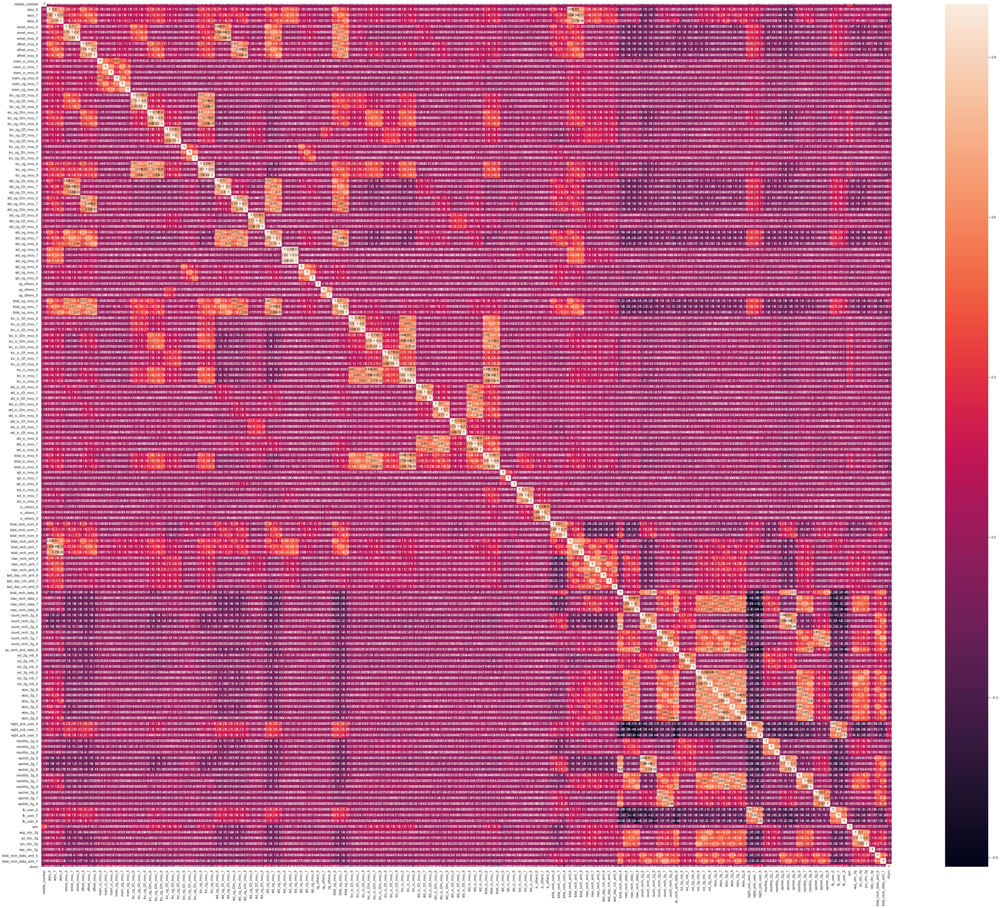

In [241]:
# Let's see the correlation matrix 
plt.figure(figsize = (60,50))        # Size of the figure
sns.heatmap(corr,annot = True)
plt.show()

## Visualising Categorical Data

In [242]:
def Ploy_cat(df,i):
        plt.figure(figsize=(15,7))

        plt.subplot(1,2,1)
        plt.title(i+' Histogram')
        plt.xticks(rotation=45)
        sns.countplot(x = i,
              data = churn_dataset_hvc,
              order = churn_dataset_hvc[i].value_counts().index)

        plt.subplot(1,2,2)
        
        plt.title(i+' vs churn')
        plt.xticks(rotation=45)
        ax=sns.boxplot(x=df[i], y=df['churn'], palette=("cubehelix"))
        ax.set_ylabel('churn', fontsize=16)
        ax.set_xlabel(i, fontsize=10)

        plt.show()

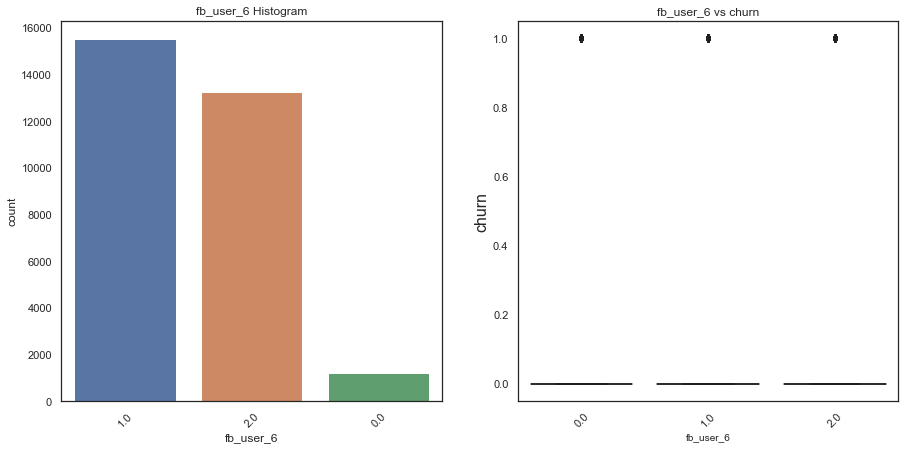

In [243]:
Ploy_cat(churn_dataset_hvc,'fb_user_6')

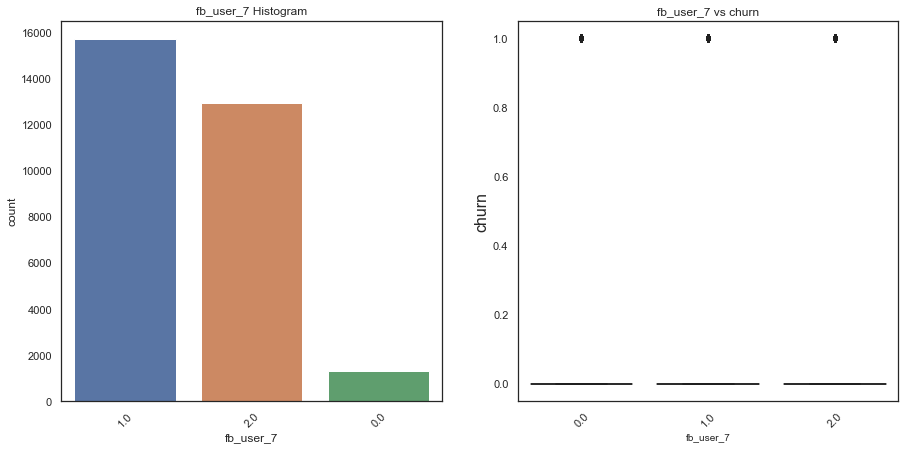

In [244]:
Ploy_cat(churn_dataset_hvc,'fb_user_7')

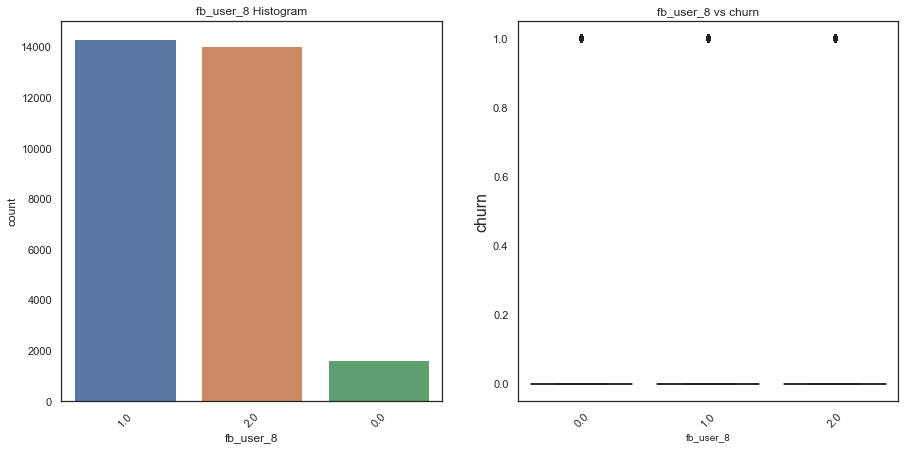

In [245]:
Ploy_cat(churn_dataset_hvc,'fb_user_8')

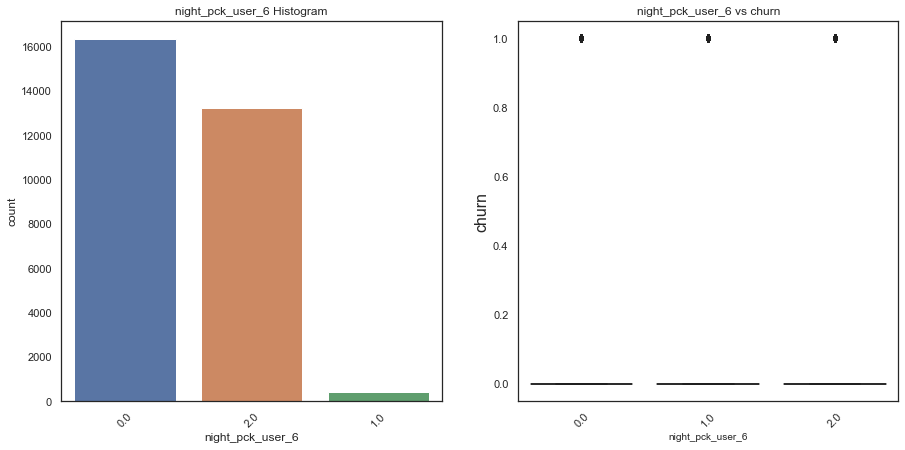

In [246]:
Ploy_cat(churn_dataset_hvc,'night_pck_user_6')

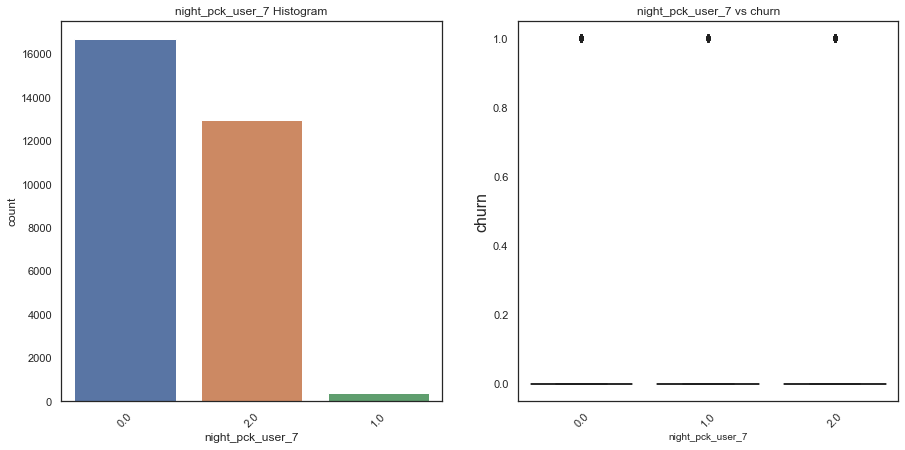

In [247]:
Ploy_cat(churn_dataset_hvc,'night_pck_user_7')

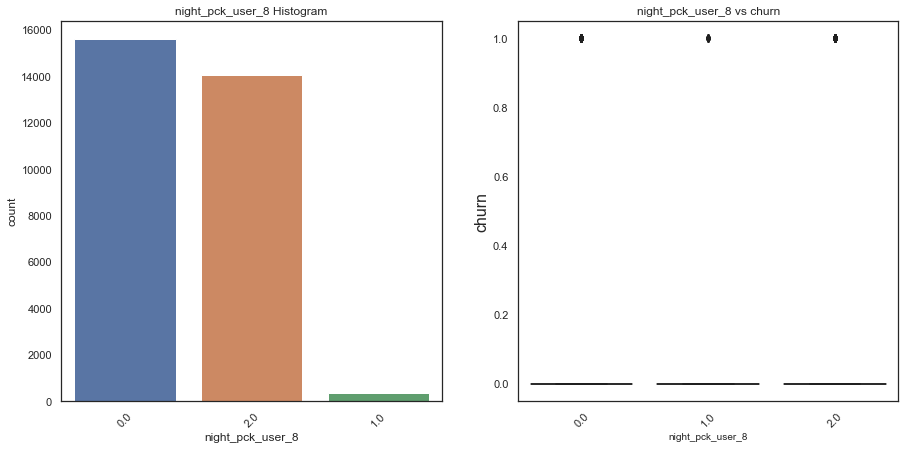

In [248]:
Ploy_cat(churn_dataset_hvc,'night_pck_user_8')

### Numerical Data Visualization

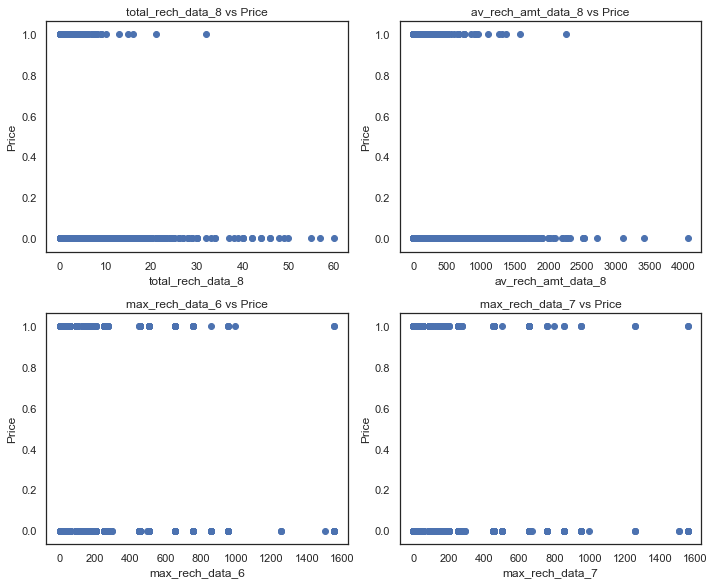

In [249]:
def scatter(x,fig):
    plt.subplot(5,2,fig)
    plt.scatter(churn_dataset_hvc[x],churn_dataset_hvc['churn'])
    plt.title(x+' vs Price')
    plt.ylabel('Price')
    plt.xlabel(x)

plt.figure(figsize=(10,20))

scatter('total_rech_data_8', 1)
scatter('av_rech_amt_data_8', 2)
scatter('max_rech_data_6', 3)
scatter('max_rech_data_7', 4)

plt.tight_layout()

Operatorwise Call usage

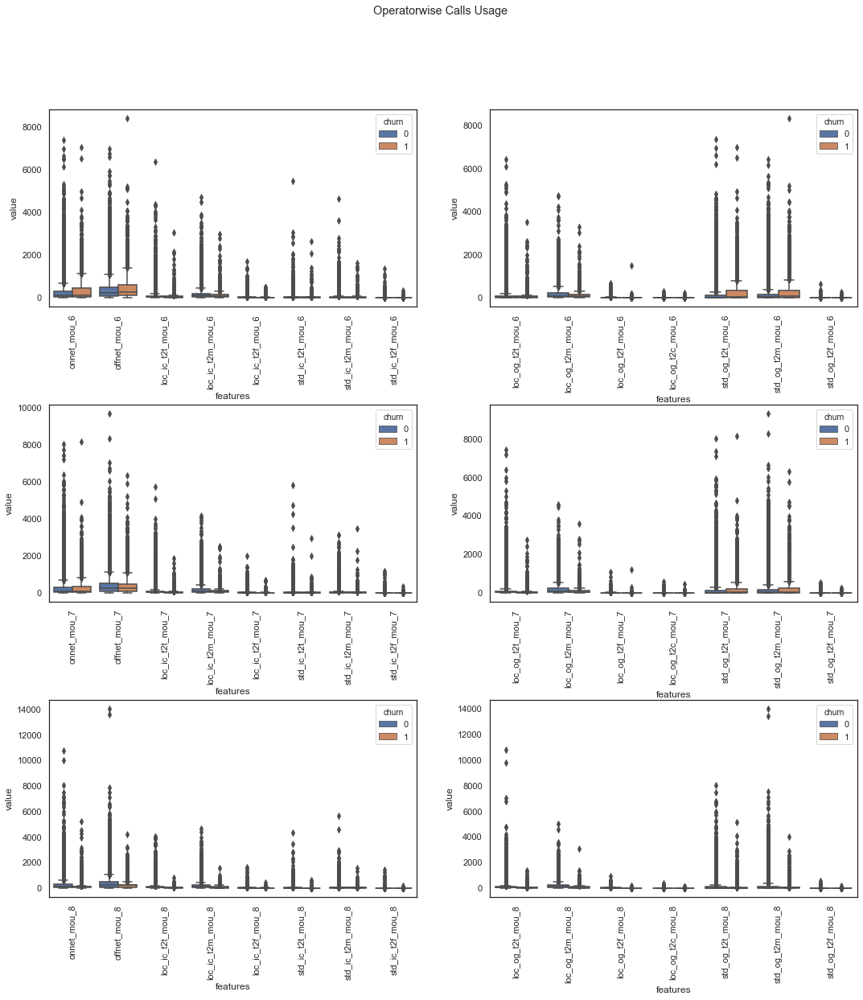

In [250]:
cols = [['onnet_mou_6','offnet_mou_6','loc_ic_t2t_mou_6','loc_ic_t2m_mou_6','loc_ic_t2f_mou_6','std_ic_t2t_mou_6','std_ic_t2m_mou_6','std_ic_t2f_mou_6'],
        ['loc_og_t2t_mou_6','loc_og_t2m_mou_6','loc_og_t2f_mou_6','loc_og_t2c_mou_6','std_og_t2t_mou_6','std_og_t2m_mou_6','std_og_t2f_mou_6'],
        ['onnet_mou_7','offnet_mou_7','loc_ic_t2t_mou_7','loc_ic_t2m_mou_7','loc_ic_t2f_mou_7','std_ic_t2t_mou_7','std_ic_t2m_mou_7','std_ic_t2f_mou_7'],
        ['loc_og_t2t_mou_7','loc_og_t2m_mou_7','loc_og_t2f_mou_7','loc_og_t2c_mou_7','std_og_t2t_mou_7','std_og_t2m_mou_7','std_og_t2f_mou_7'],
        ['onnet_mou_8','offnet_mou_8','loc_ic_t2t_mou_8','loc_ic_t2m_mou_8','loc_ic_t2f_mou_8','std_ic_t2t_mou_8','std_ic_t2m_mou_8','std_ic_t2f_mou_8'],
        ['loc_og_t2t_mou_8','loc_og_t2m_mou_8','loc_og_t2f_mou_8','loc_og_t2c_mou_8','std_og_t2t_mou_8','std_og_t2m_mou_8','std_og_t2f_mou_8']]

# plot for the operatorwise calls usage
plt.figure(figsize=(18, 18))
plt.subplots_adjust(hspace=0.5)
for i in range(0,6):
    plt.subplot(3,2,i+1)
    X = pd.concat([churn_dataset_hvc[cols[i]], churn_dataset_hvc['churn']], axis=1)
    X = pd.melt(X,id_vars="churn",var_name="features",value_name='value')
    sns.boxplot(x="features", y="value", hue="churn", data=X)
    plt.xticks(rotation=90)    
    plt.suptitle('Operatorwise Calls Usage')

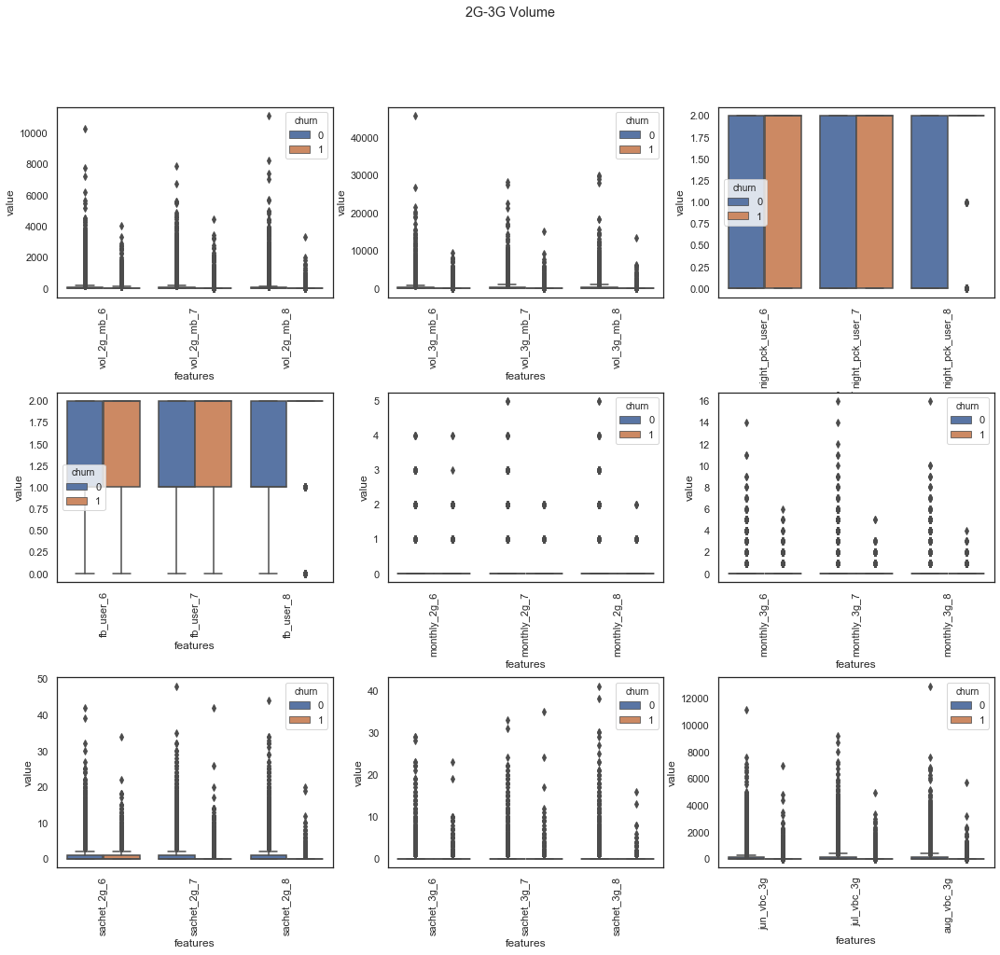

In [251]:
cols = [
        ['vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8'],
        ['vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8'],
        ['night_pck_user_6','night_pck_user_7','night_pck_user_8'],
        ['fb_user_6','fb_user_7','fb_user_8'],
        ['monthly_2g_6','monthly_2g_7','monthly_2g_8'],
        ['monthly_3g_6','monthly_3g_7','monthly_3g_8'],
        ['sachet_2g_6','sachet_2g_7','sachet_2g_8'],
        ['sachet_3g_6','sachet_3g_7','sachet_3g_8'],
        ['jun_vbc_3g','jul_vbc_3g','aug_vbc_3g']
       ]


# plot for the 2g-3g volume
plt.figure(figsize=(18, 15))
plt.subplots_adjust(hspace=0.5)
for i in range(0,9):
    plt.subplot(3,3,i+1)
    X = pd.concat([churn_dataset_hvc[cols[i]], churn_dataset_hvc['churn']], axis=1)
    X = pd.melt(X,id_vars="churn",var_name="features",value_name='value')
    sns.boxplot(x="features", y="value", hue="churn", data=X)
    plt.xticks(rotation=90)    
    plt.suptitle('2G-3G Volume')

2G and 3G volume columns also seem to have outliers at the top percentile.

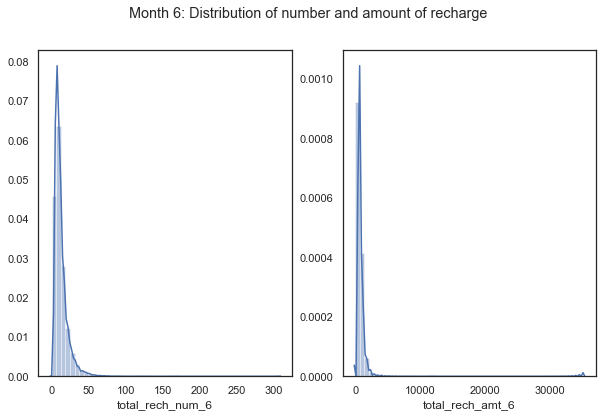

In [252]:
sns.set(style="white")
s = plt.figure(figsize=(10, 6))
s.suptitle("Month 6: Distribution of number and amount of recharge")
plt.subplot(1,2,1)
sns.distplot(churn_dataset_hvc['total_rech_num_6'])
plt.subplot(1,2,2)
sns.distplot(churn_dataset_hvc['total_rech_amt_6'])
plt.show()

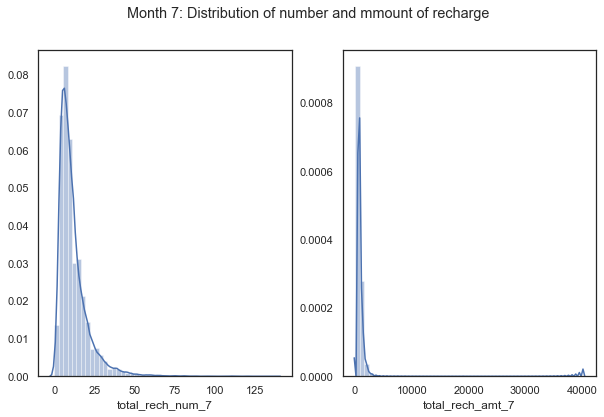

In [253]:
sns.set(style="white")
s=plt.figure(figsize=(10, 6))
s.suptitle("Month 7: Distribution of number and mmount of recharge")
plt.subplot(1,2,1)
sns.distplot(churn_dataset_hvc['total_rech_num_7'])
plt.subplot(1,2,2)
sns.distplot(churn_dataset_hvc['total_rech_amt_7'])
# plt.show()

Operatorwise calls usage columns also seem to have outliers at the top percentile.

## Outlier Treatment

In [254]:
#Removing the entries above 99 percentile and below 1 percentile
cols = [col for col in list(churn_dataset_hvc.describe().columns) if col not in ['churn','mobile_number']]

for col in cols:
    ptls = churn_dataset_hvc[col].quantile([0.01,0.99]).values
    churn_dataset_hvc[col][churn_dataset_hvc[col] <= ptls[0]] = ptls[0]
    churn_dataset_hvc[col][churn_dataset_hvc[col] >= ptls[1]] = ptls[1]

## Feature Engineering

## Creating Derived Variables from the Dataset

In [255]:
churn_dataset_hvc['AVG_arpu_6_7'] = churn_dataset_hvc[['arpu_6','arpu_7']].mean(axis=1)
churn_dataset_hvc['arpu_diff'] = churn_dataset_hvc.arpu_8 - churn_dataset_hvc['AVG_arpu_6_7']
churn_dataset_hvc.drop(['arpu_6','arpu_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_onnet_mou_6_7'] = churn_dataset_hvc[['onnet_mou_6','onnet_mou_7']].mean(axis=1)
churn_dataset_hvc['onnet_mou_diff'] = churn_dataset_hvc.onnet_mou_8 - churn_dataset_hvc['AVG_onnet_mou_6_7']
churn_dataset_hvc.drop(['onnet_mou_6','onnet_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_offnet_mou_6_7'] = churn_dataset_hvc[['offnet_mou_6','offnet_mou_7']].mean(axis=1)
churn_dataset_hvc['offnet_mou_diff'] = churn_dataset_hvc.offnet_mou_8 - churn_dataset_hvc['AVG_offnet_mou_6_7']
churn_dataset_hvc.drop(['offnet_mou_6','offnet_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_roam_ic_mou_6_7'] = churn_dataset_hvc[['roam_ic_mou_6','roam_ic_mou_7']].mean(axis=1)
churn_dataset_hvc['roam_ic_mou_diff'] = churn_dataset_hvc.roam_ic_mou_8 - churn_dataset_hvc['AVG_roam_ic_mou_6_7']
churn_dataset_hvc.drop(['roam_ic_mou_6','roam_ic_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_roam_og_mou_6_7'] = churn_dataset_hvc[['roam_og_mou_6','roam_og_mou_7']].mean(axis=1)
churn_dataset_hvc['roam_og_mou_diff'] = churn_dataset_hvc.roam_og_mou_8 - churn_dataset_hvc['AVG_roam_og_mou_6_7']
churn_dataset_hvc.drop(['roam_og_mou_6','roam_og_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_loc_og_mou_6_7'] = churn_dataset_hvc[['loc_og_mou_6','loc_og_mou_7']].mean(axis=1)
churn_dataset_hvc['loc_og_mou_diff'] = churn_dataset_hvc.loc_og_mou_8 - churn_dataset_hvc['AVG_loc_og_mou_6_7']
churn_dataset_hvc.drop(['loc_og_mou_6','loc_og_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_std_og_mou_6_7'] = churn_dataset_hvc[['std_og_mou_6','std_og_mou_7']].mean(axis=1)
churn_dataset_hvc['std_og_mou_diff'] = churn_dataset_hvc.std_og_mou_8 - churn_dataset_hvc['AVG_std_og_mou_6_7']
churn_dataset_hvc.drop(['std_og_mou_6','std_og_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_isd_og_mou_6_7'] = churn_dataset_hvc[['isd_og_mou_6','isd_og_mou_7']].mean(axis=1)
churn_dataset_hvc['isd_og_mou_diff'] = churn_dataset_hvc.isd_og_mou_8 - churn_dataset_hvc['AVG_isd_og_mou_6_7']
churn_dataset_hvc.drop(['isd_og_mou_6','isd_og_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_spl_og_mou_6_7'] = churn_dataset_hvc[['spl_og_mou_6','spl_og_mou_7']].mean(axis=1)
churn_dataset_hvc['spl_og_mou_diff'] = churn_dataset_hvc.spl_og_mou_8 - churn_dataset_hvc['AVG_spl_og_mou_6_7']
churn_dataset_hvc.drop(['spl_og_mou_6','spl_og_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_total_og_mou_6_7'] = churn_dataset_hvc[['total_og_mou_6','total_og_mou_7']].mean(axis=1)
churn_dataset_hvc['total_og_mou_diff'] = churn_dataset_hvc.total_og_mou_8 - churn_dataset_hvc['AVG_total_og_mou_6_7']
churn_dataset_hvc.drop(['total_og_mou_6','total_og_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_loc_ic_mou_6_7'] = churn_dataset_hvc[['loc_ic_mou_6','loc_ic_mou_7']].mean(axis=1)
churn_dataset_hvc['loc_ic_mou_diff'] = churn_dataset_hvc.loc_ic_mou_8 - churn_dataset_hvc['AVG_loc_ic_mou_6_7']
churn_dataset_hvc.drop(['loc_ic_mou_6','loc_ic_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_std_ic_mou_6_7'] = churn_dataset_hvc[['std_ic_mou_6','std_ic_mou_7']].mean(axis=1)
churn_dataset_hvc['std_ic_mou_diff'] = churn_dataset_hvc.std_ic_mou_8 - churn_dataset_hvc['AVG_std_ic_mou_6_7']
churn_dataset_hvc.drop(['std_ic_mou_6','std_ic_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_isd_ic_mou_6_7'] = churn_dataset_hvc[['isd_ic_mou_6','isd_ic_mou_7']].mean(axis=1)
churn_dataset_hvc['isd_ic_mou_diff'] = churn_dataset_hvc.isd_ic_mou_8 - churn_dataset_hvc['AVG_isd_ic_mou_6_7']
churn_dataset_hvc.drop(['isd_ic_mou_6','isd_ic_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_spl_ic_mou_6_7'] = churn_dataset_hvc[['spl_ic_mou_6','spl_ic_mou_7']].mean(axis=1)
churn_dataset_hvc['spl_ic_mou_diff'] = churn_dataset_hvc.spl_ic_mou_8 - churn_dataset_hvc['AVG_spl_ic_mou_6_7']
churn_dataset_hvc.drop(['spl_ic_mou_6','spl_ic_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_total_ic_mou_6_7'] = churn_dataset_hvc[['total_ic_mou_6','total_ic_mou_7']].mean(axis=1)
churn_dataset_hvc['total_ic_mou_diff'] = churn_dataset_hvc.total_ic_mou_8 - churn_dataset_hvc['AVG_total_ic_mou_6_7'] 
churn_dataset_hvc.drop(['total_ic_mou_6','total_ic_mou_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_total_rech_num_6_7'] = churn_dataset_hvc[['total_rech_num_6','total_rech_num_7']].mean(axis=1)
churn_dataset_hvc['total_rech_num_diff'] = churn_dataset_hvc.total_rech_num_8 - churn_dataset_hvc['AVG_total_rech_num_6_7']
churn_dataset_hvc.drop(['total_rech_num_6','total_rech_num_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_total_rech_amt_6_7'] = churn_dataset_hvc[['total_rech_amt_6','total_rech_amt_7']].mean(axis=1)
churn_dataset_hvc['total_rech_amt_diff'] = churn_dataset_hvc.total_rech_amt_8 - churn_dataset_hvc['AVG_total_rech_amt_6_7']
churn_dataset_hvc.drop(['total_rech_amt_6','total_rech_amt_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_max_rech_amt_6_7'] = churn_dataset_hvc[['max_rech_amt_6','max_rech_amt_7']].mean(axis=1)
churn_dataset_hvc['max_rech_amt_diff'] = churn_dataset_hvc.max_rech_amt_8 - churn_dataset_hvc['AVG_max_rech_amt_6_7'] 
churn_dataset_hvc.drop(['max_rech_amt_6','max_rech_amt_7'],axis=1,inplace=True)

#churn_dataset_hvc['AVG_total_rech_data_6_7'] = churn_dataset_hvc[['total_rech_data_6','total_rech_data_7']].mean(axis=1)
#churn_dataset_hvc['total_rech_data_diff'] = churn_dataset_hvc.total_rech_data_8 - churn_dataset_hvc['AVG_max_rech_amt_6_7']
#churn_dataset_hvc.drop(['total_rech_data_6','total_rech_data_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_max_rech_data_6_7'] = churn_dataset_hvc[['max_rech_data_6','max_rech_data_7']].mean(axis=1)
churn_dataset_hvc['max_rech_data_diff'] = churn_dataset_hvc.max_rech_data_8 - churn_dataset_hvc['AVG_max_rech_data_6_7']
churn_dataset_hvc.drop(['max_rech_data_6','max_rech_data_7'],axis=1,inplace=True)

#churn_dataset_hvc['AVG_av_rech_amt_data_6_7'] = churn_dataset_hvc[['av_rech_amt_data_6','av_rech_amt_data_7']].mean(axis=1)
#churn_dataset_hvc['av_rech_amt_data_diff'] = churn_dataset_hvc.av_rech_amt_data_8 - churn_dataset_hvc['AVG_av_rech_amt_data_6_7']
#churn_dataset_hvc.drop(['av_rech_amt_data_6','av_rech_amt_data_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_vol_2g_mb_6_7'] = churn_dataset_hvc[['vol_2g_mb_6','vol_2g_mb_7']].mean(axis=1)
churn_dataset_hvc['vol_2g_mb_diff'] = churn_dataset_hvc.vol_2g_mb_8 - churn_dataset_hvc['AVG_vol_2g_mb_6_7'] 
churn_dataset_hvc.drop(['vol_2g_mb_6','vol_2g_mb_7'],axis=1,inplace=True)

churn_dataset_hvc['AVG_vol_3g_mb_6_7'] = churn_dataset_hvc[['vol_3g_mb_6','vol_3g_mb_7']].mean(axis=1)
churn_dataset_hvc['vol_3g_mb_diff'] = churn_dataset_hvc.vol_3g_mb_8 - churn_dataset_hvc['AVG_vol_3g_mb_6_7']
churn_dataset_hvc.drop(['vol_3g_mb_6','vol_3g_mb_7'],axis=1,inplace=True)

In [256]:
# lets now conevrt AON in months
churn_dataset_hvc['aon_mon'] = churn_dataset_hvc['aon']/30
churn_dataset_hvc.drop('aon', axis=1, inplace=True)
churn_dataset_hvc['aon_mon'].head()

0    32.27
7    26.73
8    10.50
21   24.00
23   20.13
Name: aon_mon, dtype: float64

## Creating Dummy Variables

In [257]:
#split the columns into category and numerical
cat_cols = ['night_pck_user_6','monthly_2g_6','sachet_2g_6','monthly_3g_6','sachet_3g_6','fb_user_6',
            'night_pck_user_7','monthly_2g_7','sachet_2g_7','monthly_3g_7','sachet_3g_7','fb_user_7',
            'night_pck_user_8','monthly_2g_8','sachet_2g_8','monthly_3g_8','sachet_3g_8','fb_user_8'] 
num_cols = list(set(churn_dataset_hvc.columns).difference(set(cat_cols)))

In [258]:
# dummy encode the categorical columns
churn_dataset_hvc = pd.concat([churn_dataset_hvc,pd.get_dummies(churn_dataset_hvc[cat_cols], drop_first=True)], axis=1)

# drop the original columns
churn_dataset_hvc.drop(cat_cols, axis=1, inplace=True)

In [259]:
X = churn_dataset_hvc.drop(['churn','mobile_number'], axis=1)

y = churn_dataset_hvc['churn']

In [260]:
X.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,...,total_rech_amt_diff,AVG_max_rech_amt_6_7,max_rech_amt_diff,AVG_max_rech_data_6_7,max_rech_data_diff,AVG_vol_2g_mb_6_7,vol_2g_mb_diff,AVG_vol_3g_mb_6_7,vol_3g_mb_diff,aon_mon
0,213.80,0.00,0.00,0.00,0.00,25.58,25.78,0.00,80.24,81.69,...,-55.00,252.00,0.00,252.00,0.00,15.72,-9.97,117.16,-7.55,32.27
7,1986.62,52.29,325.91,31.64,38.06,51.39,31.38,40.28,308.63,447.38,...,1156.00,895.00,56.00,0.00,0.00,0.00,0.00,0.00,0.00,26.73
8,137.36,35.08,136.48,0.00,0.00,297.13,217.59,12.49,80.96,70.58,...,-399.00,122.00,-92.00,77.00,-54.00,178.00,-177.97,375.48,-363.54,10.50
21,637.76,85.14,983.39,0.00,0.00,4.48,6.16,23.34,91.81,87.93,...,78.00,50.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,24.00
23,366.97,33.58,205.89,0.00,0.00,48.96,50.66,33.58,82.94,83.01,...,212.00,89.50,89.50,89.50,89.50,0.24,-0.23,299.55,710.38,20.13


## Split into train test

In [261]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, train_size=0.7, random_state=1,stratify=y)
print("Dimension of X_train:", X_train.shape)
print("Dimension of X_test:", X_test.shape)

Dimension of X_train: (21000, 132)
Dimension of X_test: (9001, 132)


In [262]:
num_cols.remove('churn')
num_cols.remove('mobile_number')

## Step 4: Feature Scaling

In [263]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train[num_cols]=scaler.fit_transform(X_train[num_cols])
X_test[num_cols]=scaler.fit_transform(X_test[num_cols])

# Model Building

### Using RFE and VIF to select imporatant variables and remove multicollinearity in the dataset

In [264]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(random_state=10)

In [265]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train, y_train)


In [266]:
rfe.support_

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False,  True, False, False, False,
        True, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False,  True,
        True,  True, False, False, False, False, False, False, False,
       False, False, False,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True, False, False, False, False, False, False,
        True,  True, False, False, False, False, False, False, False,
       False, False,

In [267]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_8', False, 25),
 ('onnet_mou_8', False, 113),
 ('offnet_mou_8', False, 35),
 ('roam_ic_mou_8', False, 111),
 ('roam_og_mou_8', False, 55),
 ('loc_og_t2t_mou_6', False, 104),
 ('loc_og_t2t_mou_7', False, 56),
 ('loc_og_t2t_mou_8', False, 21),
 ('loc_og_t2m_mou_6', False, 13),
 ('loc_og_t2m_mou_7', False, 38),
 ('loc_og_t2m_mou_8', False, 12),
 ('loc_og_t2f_mou_6', False, 115),
 ('loc_og_t2f_mou_7', False, 22),
 ('loc_og_t2f_mou_8', False, 75),
 ('loc_og_t2c_mou_6', False, 86),
 ('loc_og_t2c_mou_7', False, 116),
 ('loc_og_t2c_mou_8', False, 85),
 ('loc_og_mou_8', False, 7),
 ('std_og_t2t_mou_6', False, 72),
 ('std_og_t2t_mou_7', False, 73),
 ('std_og_t2t_mou_8', True, 1),
 ('std_og_t2m_mou_6', False, 15),
 ('std_og_t2m_mou_7', False, 16),
 ('std_og_t2m_mou_8', True, 1),
 ('std_og_t2f_mou_6', False, 88),
 ('std_og_t2f_mou_7', False, 110),
 ('std_og_t2f_mou_8', False, 49),
 ('std_og_mou_8', True, 1),
 ('isd_og_mou_8', False, 91),
 ('spl_og_mou_8', False, 103),
 ('og_others_6', Fals

In [268]:
X_train.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,...,total_rech_amt_diff,AVG_max_rech_amt_6_7,max_rech_amt_diff,AVG_max_rech_data_6_7,max_rech_data_diff,AVG_vol_2g_mb_6_7,vol_2g_mb_diff,AVG_vol_3g_mb_6_7,vol_3g_mb_diff,aon_mon
49043,1.86,-0.39,1.70,-0.25,-0.27,-0.09,-0.42,-0.12,-0.07,0.09,...,1.45,2.13,1.75,0.98,-0.09,-0.17,-0.23,-0.10,-0.36,1.27
47984,0.31,0.08,-0.25,-0.25,-0.27,1.09,1.56,1.32,0.01,0.12,...,0.55,-0.11,0.09,0.84,0.08,3.82,0.37,-0.41,-0.15,1.21
9086,-1.15,-0.58,-0.75,-0.25,-0.27,-0.42,-0.51,-0.52,0.96,-0.69,...,-2.01,2.80,-4.71,1.64,-3.10,-0.48,0.09,-0.00,-0.68,1.21
24567,0.23,1.10,-0.52,-0.25,-0.27,-0.34,-0.27,-0.27,-0.09,-0.25,...,-1.92,0.25,0.08,1.37,0.07,-0.47,0.19,2.91,-3.21,0.16
54188,0.50,-0.52,0.53,-0.25,-0.27,-0.01,-0.31,-0.34,1.70,2.52,...,0.93,-0.11,0.28,0.84,0.38,2.33,-0.01,-0.53,0.01,1.60


In [269]:
X_train.columns[~rfe.support_]

Index(['arpu_8', 'onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8',
       'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       ...
       'total_rech_amt_diff', 'AVG_max_rech_amt_6_7', 'max_rech_amt_diff',
       'AVG_max_rech_data_6_7', 'max_rech_data_diff', 'AVG_vol_2g_mb_6_7',
       'vol_2g_mb_diff', 'AVG_vol_3g_mb_6_7', 'vol_3g_mb_diff', 'aon_mon'],
      dtype='object', length=117)

In [270]:
col = X_train.columns[rfe.support_]

In [271]:
X_train_rfe = X_train[X_train.columns[rfe.support_]]
X_train_rfe.head()

,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_mou_8,total_og_mou_8,loc_ic_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,total_rech_data_8,max_rech_data_8,sep_vbc_3g,AVG_loc_ic_mou_6_7,loc_ic_mou_diff,AVG_total_ic_mou_6_7,total_ic_mou_diff
49043,-0.35,1.72,0.83,0.89,0.84,0.04,0.67,-0.26,-0.22,0.83,-0.22,0.56,0.52,0.38,0.52
47984,-0.40,-0.45,-0.54,-0.08,0.88,-0.41,0.59,-0.26,-0.22,0.83,-0.22,1.49,-1.01,1.10,-0.79
9086,-0.42,-0.42,-0.53,-0.81,-0.01,-0.39,-0.14,-0.26,-0.61,-0.71,-0.22,0.31,-0.54,0.20,-0.57
24567,1.44,-0.26,0.72,0.37,-0.15,0.01,-0.15,-0.26,0.96,1.31,-0.22,-0.35,0.35,-0.41,0.40
54188,-0.42,-0.45,-0.55,0.05,0.41,-0.48,0.19,-0.26,0.17,1.04,-0.22,0.43,-0.01,0.19,0.01


In [272]:
def calculateVIF(X):
    vif = pd.DataFrame()
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

In [273]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                21000
Model:                            GLM   Df Residuals:                    20986
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3821.5
Date:                Mon, 06 Jul 2020   Deviance:                       7643.0
Time:                        16:43:35   Pearson chi2:                 3.55e+10
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -4.5062      0.117    -38.480      0.000      -4.736      -4.277
std_og_t2t_mou_8        -1.1973      0.186     -6.420      0.000      -1.563      -0.832
std_og_t2m_mou_8        -1.1081      0.187     -5.913      0.000      -1.475      -0.741
std_og_mou_8             2.7585      0.343      8.032      0.000       2.085       3.432
total_og_mou_8          -1.7101      0.201     -8.518      0.000      -2.104      -1.317
loc_ic_mou_8             1.5060      0.098     15.340      0.000       1.314       1.698
std_ic_mou_8             1.0795      0.090     11.991      0.000       0.903       1.256
total_ic_mou_8          -2.6615      0.132    -20.235      0.000      -2.919      -2.404
spl_ic_mou_8            -0.6410      0.099     -6.484      0.000      -0.835      -0.447
total_rech_data_8       -0.7551      0.066    -11.403      0.000      -0.885      -0.625
max_rech_data_8         -0.7229      0.051    -14.267      0.000      -0.822      -0.624
sep_vbc_3g              -1.9015      0.440     -4.318      0.000      -2.765      -1.038
AVG_loc_ic_mou_6_7       1.1308      0.087     12.942      0.000       0.960       1.302
loc_ic_mou_diff          0.7364      0.058     12.658      0.000       0.622       0.850
AVG_total_ic_mou_6_7    -1.8159      0.109    -16.688      0.000      -2.029      -1.603
total_ic_mou_diff       -1.5835      0.071    -22.312      0.000      -1.723      -1.444
========================================================================================
"""

In [274]:
calculateVIF(X_train[col])

,Features,VIF
11,AVG_loc_ic_mou_6_7,13075826.99
12,loc_ic_mou_diff,1285964.85
14,total_ic_mou_diff,1052648.00
13,AVG_total_ic_mou_6_7,1034115.00
4,loc_ic_mou_8,728763.97
6,total_ic_mou_8,703307.02
2,std_og_mou_8,63.11
0,std_og_t2t_mou_8,26.60
1,std_og_t2m_mou_8,26.17
3,total_og_mou_8,4.56


In [275]:
#drop column having high p value 'Tags_Lateral student'
col = col.drop('AVG_loc_ic_mou_6_7', 1)

In [276]:
calculateVIF(X_train[col])

,Features,VIF
6,total_ic_mou_8,inf
12,AVG_total_ic_mou_6_7,inf
13,total_ic_mou_diff,inf
2,std_og_mou_8,64.59
0,std_og_t2t_mou_8,26.58
1,std_og_t2m_mou_8,26.17
4,loc_ic_mou_8,13.94
11,loc_ic_mou_diff,4.63
3,total_og_mou_8,4.56
5,std_ic_mou_8,2.85


In [277]:
#drop column having high p value 'Tags_Lateral student'
col = col.drop('total_ic_mou_8', 1)

In [278]:
calculateVIF(X_train[col])

,Features,VIF
2,std_og_mou_8,64.61
0,std_og_t2t_mou_8,26.61
1,std_og_t2m_mou_8,26.17
11,AVG_total_ic_mou_6_7,15.11
4,loc_ic_mou_8,13.94
12,total_ic_mou_diff,6.65
10,loc_ic_mou_diff,4.63
3,total_og_mou_8,4.56
5,std_ic_mou_8,2.85
8,max_rech_data_8,1.10


In [279]:
#drop column having high p value 'Tags_Lateral student'
col = col.drop('std_og_mou_8', 1)

In [280]:
calculateVIF(X_train[col])

,Features,VIF
10,AVG_total_ic_mou_6_7,15.11
3,loc_ic_mou_8,13.93
11,total_ic_mou_diff,6.65
9,loc_ic_mou_diff,4.63
2,total_og_mou_8,4.28
4,std_ic_mou_8,2.85
1,std_og_t2m_mou_8,2.47
0,std_og_t2t_mou_8,2.40
7,max_rech_data_8,1.10
6,total_rech_data_8,1.08


In [281]:
#drop column having high p value 'Tags_Lateral student'
col = col.drop('AVG_total_ic_mou_6_7', 1)

In [282]:
calculateVIF(X_train[col])

,Features,VIF
2,total_og_mou_8,4.28
10,total_ic_mou_diff,4.16
9,loc_ic_mou_diff,4.09
1,std_og_t2m_mou_8,2.46
0,std_og_t2t_mou_8,2.40
3,loc_ic_mou_8,1.55
4,std_ic_mou_8,1.17
7,max_rech_data_8,1.10
6,total_rech_data_8,1.08
5,spl_ic_mou_8,1.03


In [283]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                21000
Model:                            GLM   Df Residuals:                    20988
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4117.0
Date:                Mon, 06 Jul 2020   Deviance:                       8234.1
Time:                        16:43:37   Pearson chi2:                 7.56e+07
No. Iterations:                    11                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -4.4312      0.121    -36.759      0.000      -4.667      -4.195
std_og_t2t_mou_8      1.1002      0.113      9.719      0.000       0.878       1.322
std_og_t2m_mou_8      1.1854      0.112     10.564      0.000       0.966       1.405
total_og_mou_8       -2.9197      0.194    -15.031      0.000      -3.300      -2.539
loc_ic_mou_8         -0.5331      0.077     -6.898      0.000      -0.685      -0.382
std_ic_mou_8         -0.3305      0.059     -5.565      0.000      -0.447      -0.214
spl_ic_mou_8         -0.7179      0.101     -7.087      0.000      -0.916      -0.519
total_rech_data_8    -0.9043      0.069    -13.144      0.000      -1.039      -0.769
max_rech_data_8      -0.7216      0.052    -13.896      0.000      -0.823      -0.620
sep_vbc_3g           -2.1773      0.467     -4.663      0.000      -3.092      -1.262
loc_ic_mou_diff       0.6004      0.056     10.635      0.000       0.490       0.711
total_ic_mou_diff    -0.9061      0.057    -15.782      0.000      -1.019      -0.794
=====================================================================================
"""

In [284]:
def CalculateMetrics(confusion):
    TP = confusion[1,1] # true positive 
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives
    print("Sesitivity For the Model : ",(TP / float(TP+FN)))
    print("specificity For the Model : ",(TN / float(TN+FP)))
    print("false postive rate For the Model : ",(FP/ float(TN+FP)))
    print("precision/false postive rate For the Model : ",(TP / float(TP+FP)))
    print("Negative predictive value For the Model : ",(TN / float(TN+ FN)))  

In [285]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = roc_curve( actual, probs, drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

In [286]:
# Logistic Regression

from sklearn.linear_model import LogisticRegression
from sklearn import metrics

logreg = LogisticRegression(class_weight='balanced',random_state=2)
logreg.fit(X_train[col], y_train)

y_pred = logreg.predict(X_test[col])
print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))
# Confusion matrix 
confusion = metrics.confusion_matrix(y_test, y_pred)
CalculateMetrics(confusion)

Accuracy 0.7835796022664149
Recall/Sensitivity 0.8101092896174863
Sesitivity For the Model :  0.8101092896174863
specificity For the Model :  0.781231104123836
false postive rate For the Model :  0.218768895876164
precision/false postive rate For the Model :  0.24687760199833472
Negative predictive value For the Model :  0.9789362024549174


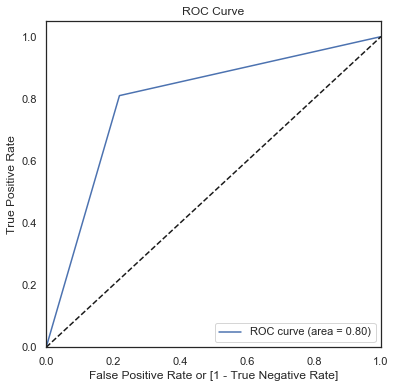

In [287]:

# ROC-AUC curve
draw_roc(y_test, y_pred)

### Selecting Final features

In [288]:
#Selecting the coefficients of the selected features from our final model excluding the intercept
pd.options.display.float_format = '{:.2f}'.format
new_params = res.params[1:]
new_params.sort_values(ascending=False)

std_og_t2m_mou_8     1.19
std_og_t2t_mou_8     1.10
loc_ic_mou_diff      0.60
std_ic_mou_8        -0.33
loc_ic_mou_8        -0.53
spl_ic_mou_8        -0.72
max_rech_data_8     -0.72
total_rech_data_8   -0.90
total_ic_mou_diff   -0.91
sep_vbc_3g          -2.18
total_og_mou_8      -2.92
dtype: float64

### Applying Different Models with PCA

#### Using smote to balance the unbalanced dataset

In [79]:
smote = SMOTE(random_state=42)
X, y = smote.fit_sample(X, y.ravel())


print('Class Balance count : ',Counter(y))

Class Balance count :  Counter({1: 27560, 0: 27560})


In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 4, stratify = y)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(38584, 132) (38584,)
(16536, 132) (16536,)


In [81]:
from sklearn.preprocessing import MinMaxScaler


scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [82]:
#initialize the pca with randomized
pca = PCA(svd_solver='randomized', random_state=42)
# fit the training dataset
pca.fit(X_train)

PCA(random_state=42, svd_solver='randomized')

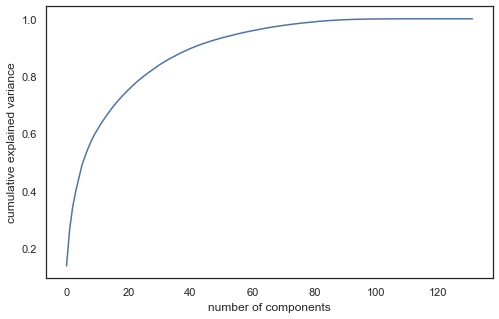

In [83]:
#Screeplot for the PCA components
%matplotlib inline
fig = plt.figure(figsize = (8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [84]:
# logistic regression - the class weight is used to handle class imbalance - it adjusts the cost function
logistic = LogisticRegression()
# PCA
pca = PCA()

# logistic regression - the class weight is used to handle class imbalance - it adjusts the cost function
logistic = LogisticRegression()

# create pipeline
steps = [ ("pca", pca),
         ("logistic", logistic)
        ]

# compile pipeline
pca_logistic = Pipeline(steps)
# hyperparameter space
params = {'pca__n_components': [60, 80], 'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=pca_logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [85]:
# Fit the grid search to the data
model.fit(X_train, y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed: 21.8min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Pipeline(steps=[('pca', PCA()),
                                       ('logistic', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],
                         'logistic__penalty': ['l1', 'l2'],
                         'pca__n_components': [60, 80]},
             scoring='roc_auc', verbose=1)

In [86]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',model.best_score_,'using',model.best_params_)

We can get accuracy of 0.9045548264296788 using {'logistic__C': 10, 'logistic__penalty': 'l2', 'pca__n_components': 80}


In [87]:
# cross validation results
pd.DataFrame(model.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_logistic__C,param_logistic__penalty,param_pca__n_components,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,32.12,3.38,0.00,0.00,0.10,l1,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",nan,nan,nan,nan,nan,nan,nan,32
1,33.47,6.34,0.00,0.00,0.10,l1,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",nan,nan,nan,nan,nan,nan,nan,19
2,33.96,4.44,0.05,0.04,0.10,l2,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.90,0.90,0.90,0.90,0.91,0.90,0.00,16
3,30.46,3.25,0.08,0.03,0.10,l2,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.90,0.90,0.90,0.90,0.91,0.90,0.00,15
4,31.77,5.87,0.00,0.00,0.50,l1,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",nan,nan,nan,nan,nan,nan,nan,24
5,30.55,3.15,0.00,0.00,0.50,l1,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",nan,nan,nan,nan,nan,nan,nan,22
6,32.98,4.27,0.03,0.01,0.50,l2,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.91,0.90,0.90,0.90,0.91,0.90,0.00,14
7,28.28,1.90,0.07,0.03,0.50,l2,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.91,0.90,0.90,0.90,0.91,0.90,0.00,7
8,32.42,3.89,0.00,0.00,1,l1,60,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",nan,nan,nan,nan,nan,nan,nan,30
9,30.57,5.38,0.00,0.00,1,l1,80,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",nan,nan,nan,nan,nan,nan,nan,29


In [88]:
# Initialize pca with 50 components
pca = PCA(n_components=80, random_state=42)
# fit and transform the training dataset
X_train_pca = pca.fit_transform(X_train)
# transform the testing dataset
X_test_pca = pca.transform(X_test)
# fit and transform the whole dataset
X_pca = pca.fit_transform(X)

In [90]:
# Initialize the Logistic regression
model = LogisticRegression(C=10, penalty='l2',random_state=42)
# fit the pca training data
model.fit(X_train_pca, y_train)
# predict the testing pca data
y_pred = model.predict(X_test_pca)
print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))
confusion = metrics.confusion_matrix(y_test, y_pred)
CalculateMetrics(confusion)

Accuracy 0.8333333333333334
Recall/Sensitivity 0.8577648766328012
Sesitivity For the Model :  0.8577648766328012
specificity For the Model :  0.8089017900338655
false postive rate For the Model :  0.1910982099661345
precision/false postive rate For the Model :  0.8178044280442804
Negative predictive value For the Model :  0.8504577822990844


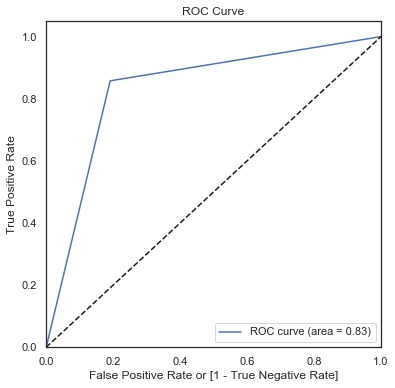

In [91]:

# ROC-AUC curve
draw_roc(y_test, y_pred)

## Decision Tree Model

In [92]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier
# Create the parameter grid
param_grid = {
 'max_depth': range(5, 15, 5),
 'min_samples_leaf': range(50, 150, 50),
 'min_samples_split': range(50, 150, 50),
 'criterion': ["entropy", "gini"]
}
# Create a based model
dt = DecisionTreeClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = dt, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

In [93]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed:   55.2s finished


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             verbose=1)

In [94]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.8937123671205622 using {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 50, 'min_samples_split': 50}


In [95]:
# cross validation results
pd.DataFrame(grid_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,4.34,0.19,0.03,0.02,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.88,0.88,0.87,0.88,0.00,13
1,4.23,0.03,0.02,0.00,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.88,0.88,0.87,0.88,0.00,13
2,4.48,0.46,0.01,0.00,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.88,0.88,0.87,0.88,0.00,15
3,4.13,0.02,0.01,0.00,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.88,0.88,0.87,0.88,0.00,15
4,6.89,0.11,0.02,0.00,entropy,10,50,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.90,0.89,0.89,0.89,0.00,1
5,7.28,0.44,0.02,0.00,entropy,10,50,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.89,0.89,0.89,0.89,0.00,2
6,6.71,0.28,0.02,0.00,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.88,0.88,0.89,0.88,0.00,5
7,6.49,0.05,0.03,0.02,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.88,0.88,0.89,0.88,0.00,5
8,2.67,0.07,0.01,0.00,gini,5,50,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.88,0.88,0.88,0.88,0.00,11
9,2.56,0.02,0.02,0.00,gini,5,50,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.88,0.88,0.88,0.88,0.00,11


In [96]:

dtc = DecisionTreeClassifier(criterion= 'entropy',
                             max_depth=10,
                             random_state = 100,
                             min_samples_leaf=50, 
                             min_samples_split=100)

## DecisionTree Without PCA

In [97]:
# fit
dtc.fit(X_train,y_train)
# predict
y_pred = dtc.predict(X_test)

In [98]:
# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))
CalculateMetrics(cm)

[[7374  894]
 [ 829 7439]]
Accuracy 0.8958030962747944
Recall/Sensitivity 0.8997339138848572
Sesitivity For the Model :  0.8997339138848572
specificity For the Model :  0.8918722786647315
false postive rate For the Model :  0.1081277213352685
precision/false postive rate For the Model :  0.8927157086283452
Negative predictive value For the Model :  0.8989394124100939


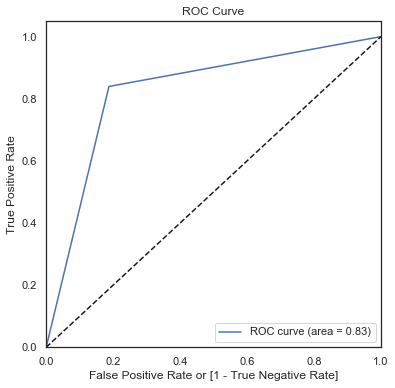

In [101]:

# ROC-AUC curve
draw_roc(y_test, y_pred)

## DecisionTree With PCA

In [102]:
# fit
dtc.fit(X_train_pca,y_train)
# predict
y_pred = dtc.predict(X_test_pca)

In [103]:
print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))

Accuracy 0.8260764392839864
Recall/Sensitivity 0.839622641509434


In [104]:
# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))
CalculateMetrics(cm)

[[6718 1550]
 [1326 6942]]
Accuracy 0.8260764392839864
Recall/Sensitivity 0.839622641509434
Sesitivity For the Model :  0.839622641509434
specificity For the Model :  0.812530237058539
false postive rate For the Model :  0.18746976294146106
precision/false postive rate For the Model :  0.8174752708431465
Negative predictive value For the Model :  0.8351566384883142


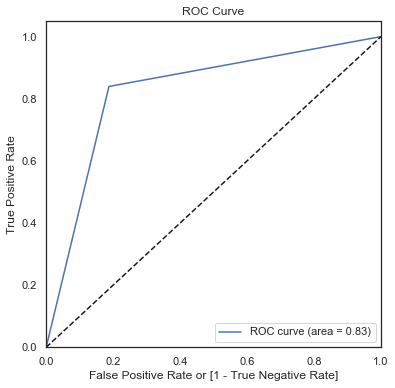

In [105]:

# ROC-AUC curve
draw_roc(y_test, y_pred)

### RandomForest Model

In [106]:
# Create the parameter grid based on the results of random search 
param_grid = {
 'max_depth': range(5, 15, 5),
 'min_samples_leaf': range(50, 150, 50),
 'min_samples_split': range(100, 300, 100),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

In [107]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 48 candidates, totalling 144 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 144 out of 144 | elapsed: 17.1min finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': range(5, 15, 5), 'max_features': [5, 10],
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(100, 300, 100),
                         'n_estimators': [100, 200, 300]},
             verbose=1)

In [108]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.907811522597115 using {'max_depth': 10, 'max_features': 10, 'min_samples_leaf': 50, 'min_samples_split': 100, 'n_estimators': 300}


In [109]:
# cross validation results
pd.DataFrame(grid_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,7.70,0.32,0.27,0.01,5,5,50,100,100,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.88,0.87,0.87,0.88,0.00,38
1,14.85,0.13,0.52,0.01,5,5,50,100,200,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.88,0.87,0.87,0.87,0.00,41
2,22.33,0.09,0.77,0.01,5,5,50,100,300,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.87,0.88,0.87,0.87,0.00,42
3,7.49,0.08,0.27,0.01,5,5,50,200,100,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.88,0.88,0.87,0.87,0.00,40
4,15.14,0.05,0.53,0.01,5,5,50,200,200,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.88,0.87,0.87,0.88,0.00,37
5,22.84,0.25,0.78,0.01,5,5,50,200,300,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.88,0.88,0.88,0.88,0.00,39
6,7.58,0.03,0.26,0.00,5,5,100,100,100,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.88,0.87,0.87,0.87,0.00,46
7,15.29,0.09,0.58,0.10,5,5,100,100,200,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.88,0.87,0.87,0.87,0.00,48
8,23.14,0.24,0.78,0.00,5,5,100,100,300,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.88,0.87,0.87,0.87,0.00,45
9,8.02,0.53,0.27,0.00,5,5,100,200,100,"{'max_depth': 5, 'max_features': 5, 'min_sampl...",0.87,0.87,0.87,0.87,0.00,43


In [110]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(criterion= 'entropy',bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=50, 
                             min_samples_split=100,
                             max_features=10,
                             n_estimators=200)

### Randomforest without PCA

In [111]:
# fit
rfc.fit(X_train,y_train)
# predict
y_pred = rfc.predict(X_test)

In [112]:
print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))

Accuracy 0.9115868408321238
Recall/Sensitivity 0.9100145137880987


In [113]:
cm = confusion_matrix(y_test, y_pred)
print(cm)

print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))
CalculateMetrics(cm)

[[7550  718]
 [ 744 7524]]
Accuracy 0.9115868408321238
Recall/Sensitivity 0.9100145137880987
Sesitivity For the Model :  0.9100145137880987
specificity For the Model :  0.913159167876149
false postive rate For the Model :  0.08684083212385099
precision/false postive rate For the Model :  0.912885222033487
Negative predictive value For the Model :  0.9102965999517724


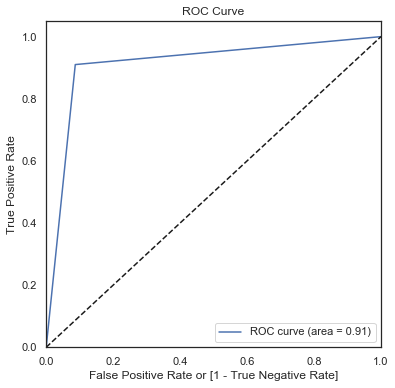

In [115]:

# ROC-AUC curve
draw_roc(y_test, y_pred)

### Randomforest With PCA

In [116]:
# fit
rfc.fit(X_train_pca,y_train)
# predict
y_pred = rfc.predict(X_test_pca)

In [117]:
print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))

Accuracy 0.8529874213836478
Recall/Sensitivity 0.8380503144654088


In [118]:
# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))
CalculateMetrics(cm)

[[7176 1092]
 [1339 6929]]
Accuracy 0.8529874213836478
Recall/Sensitivity 0.8380503144654088
Sesitivity For the Model :  0.8380503144654088
specificity For the Model :  0.8679245283018868
false postive rate For the Model :  0.1320754716981132
precision/false postive rate For the Model :  0.8638573743922204
Negative predictive value For the Model :  0.8427480916030534


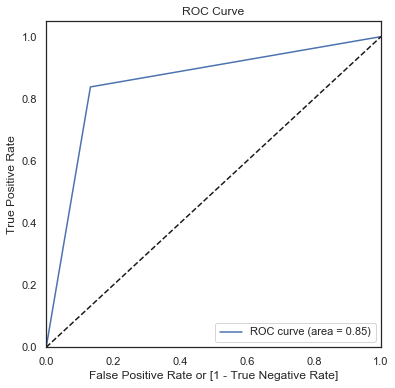

In [119]:

# ROC-AUC curve
draw_roc(y_test, y_pred)

# SVC

In [121]:
# initialize the SVC rbf kernel
model = SVC(kernel='rbf',  random_state=42)
# fit the pca training data
model.fit(X_train, y_train)
# predict the pca testing data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

print("Accuracy {}".format(metrics.accuracy_score(y_test, y_pred)))
print("Recall/Sensitivity {}".format(metrics.recall_score(y_test, y_pred)))
CalculateMetrics(cm)

[[7337  931]
 [ 718 7550]]
Accuracy 0.9002781809385583
Recall/Sensitivity 0.913159167876149
Sesitivity For the Model :  0.913159167876149
specificity For the Model :  0.8873971940009676
false postive rate For the Model :  0.11260280599903241
precision/false postive rate For the Model :  0.8902252092913572
Negative predictive value For the Model :  0.9108628181253879


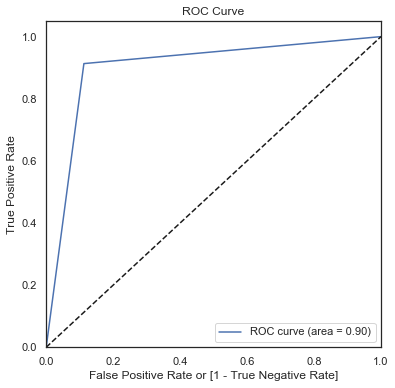

In [122]:

# ROC-AUC curve
draw_roc(y_test, y_pred)

## Final Recomendations

We are getting highest accuracy in Randomforest model without PCA.

So we will take randomforest model as a final model for our analysis

In [123]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(criterion= 'entropy',bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=50, 
                             min_samples_split=100,
                             max_features=10,
                             n_estimators=200)

In [124]:
# fit
rfc.fit(X_train,y_train)
# predict
y_pred = rfc.predict(X_test)

In [125]:
data=churn_dataset_hvc.drop(['churn','mobile_number'], axis=1)
# Check the feature importance score for each feature
feature_imp_df = pd.DataFrame({'Feature':data.columns, 'Score':rfc.feature_importances_})
# Order the features by max score
feature_imp_df = feature_imp_df.sort_values('Score', ascending=False).reset_index()
feature_imp_df.head(50)

,index,Feature,Score
0,54,total_ic_mou_8,0.07
1,0,arpu_8,0.06
2,4,roam_og_mou_8,0.05
3,3,roam_ic_mou_8,0.05
4,61,total_rech_amt_8,0.05
5,33,total_og_mou_8,0.04
6,62,max_rech_amt_8,0.03
7,65,last_day_rch_amt_8,0.03
8,66,total_rech_data_8,0.03
9,90,arpu_diff,0.03


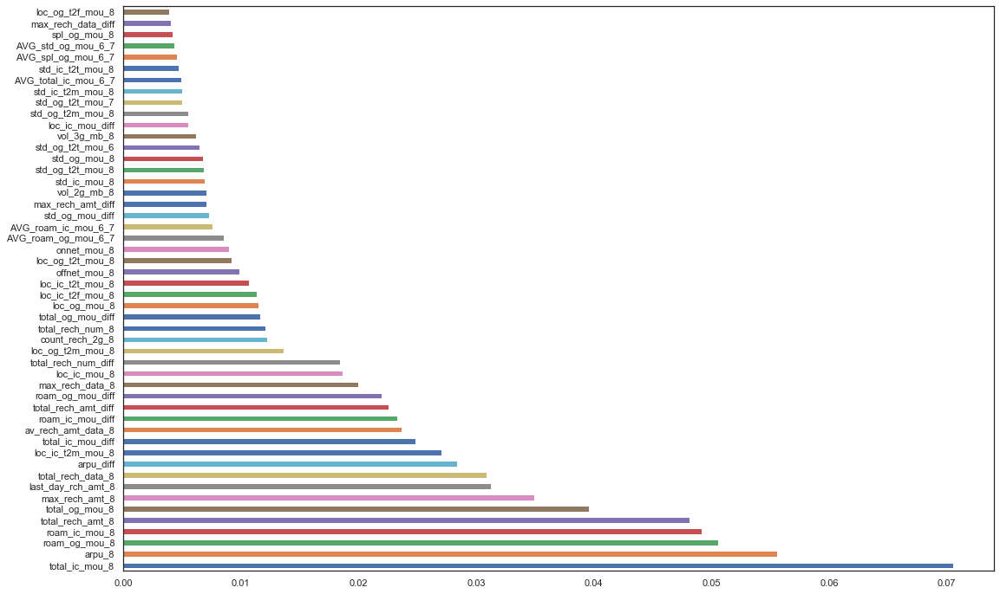

In [126]:
# plot the chart with top 50 important features
(pd.Series(rfc.feature_importances_, index=data.columns)
   .nlargest(50)
   .plot(kind='barh', figsize=(18,12)))

## Conclusion

total_ic_mou_8

Represents total Incoming calls in the recent month. Lower the value higher the churn rate.

arpu_8

Represents the average revenue per user in the recent month. Lower value has got high churn rate.

roam_og_mou_8

Represents the total outgoing minutes of usage on roaming in the recent month. Lower the value higher the churn rate.

roam_ic_mou_8


total_rech_amt_8

Represents the total number of times recharged in the recent month. Lower the value higher the churn rate.

total_og_mou_8

Represents the total outgoing minutes of usage in the recent month. Lower the value higher the churn rate.

max_rech_amt_8

Represents the maximum recharged amount in the recent month. Lower value comparatively got more churn than the other.

last_day_rch_amt_8

Represents the last recharge amount done by the user.

total_rech_data_8

Represents the total data recharge in recent month.

arpu_diff

Represents the average revenue differenec per user in the recent month. Lower value has got high churn rate.


loc_ic_t2m_mou_8

Represents the total incomming minutes of usage calls to other mobiles in the recent month. Lower value has got high churn rate.


### Hence we recommend the Telecom company to consider these driver variables which are strong indicators to manage customer churn.